## Train sea lion classifier with hog + svm

In [1]:
INPUT_DIR = '../../input/kaggle-sea-lion/02/'
INPUT_DIR2 = '../../input/kaggle-sea-lion/Train/'
OUTPUT_DIR = '../../output/kaggle-sea-lion/04/'
# IMAGE_DIMS = (42,42,3)
#IMAGE_DIMS = (84,84,3)
#IMAGE_DIMS = (32,32,3)
IMAGE_DIMS = (50,50,3)

INPUT_DATASET_NAME = 'lion-patches-0px'

RECREATE_OUTPUT_DIR = False

OUTPUT_WEIGHT = (1,1,1,1,1,5)
INPUT_RANGE = 1

BATCH_SIZE=64

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import sklearn
import os
import glob
import cv2
from sklearn import svm
from sklearn import datasets
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
import sklearn.metrics as metrics
import sklearn.cluster as cluster
import skimage
import random
import itertools
from modules.chog import CircularHOGExtractor

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras import models

from modules.logging import logger
import modules.utils as utils
from modules.utils import Timer
import modules.logging
import modules.lions as lions
import modules.objectdetect as objectdetect


Using TensorFlow backend.


## Prepare

### Prepare output dir

In [3]:
utils.mkdirs(OUTPUT_DIR, dirs=['weights'], recreate=RECREATE_OUTPUT_DIR)
modules.logging.setup_file_logger(OUTPUT_DIR + 'out.log')
WEIGHTS_DIR = OUTPUT_DIR + 'weights/'
input_dataset_path = INPUT_DIR + utils.dataset_name(INPUT_DATASET_NAME, IMAGE_DIMS)

logger.info('Output dirs created')

2017-05-22 00:09:22,571 INFO Output dirs created


### Prepare train, validate and test data flows

In [4]:
logger.info('Using dataset ' + input_dataset_path + ' as input')
h5file = h5py.File(input_dataset_path, 'r')

logger.info('Using dataset ' + input_dataset_path + ' as input')
h5file = h5py.File(input_dataset_path, 'r')

#used for image augmentation (creating new images for balancing)
image_augmentation_generator = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False,
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        zca_whitening=False,
        rotation_range=359,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0,
        horizontal_flip=True,
        vertical_flip=True)

image_randomize_generator = image_augmentation_generator

logger.info('preparing train data')
train_batch_generator = utils.BatchGeneratorXYH5(h5file, start_ratio=0, end_ratio=INPUT_RANGE)
train_balance_generator = utils.ClassBalancerGeneratorXY(train_batch_generator,
                                                         image_augmentation=image_augmentation_generator,
                                                         output_weight=OUTPUT_WEIGHT,
                                                         max_augmentation_ratio=5,
                                                         max_undersampling_ratio=1,
                                                         enforce_max_ratios=False,
                                                         batch_size=BATCH_SIZE,
                                                         start_ratio=0, end_ratio=0.7)
train_generator = utils.image_augmentation_xy(train_balance_generator.flow(), image_randomize_generator)
logger.info('train size=' + str(train_balance_generator.size) + ' batches=' + str(train_balance_generator.nr_batches))


logger.info('preparing valid data')
valid_batch_generator = utils.BatchGeneratorXYH5(h5file, start_ratio=0, end_ratio=INPUT_RANGE)
valid_balance_generator = utils.ClassBalancerGeneratorXY(valid_batch_generator,
                                                         image_augmentation=image_augmentation_generator,
                                                         output_weight=OUTPUT_WEIGHT,
                                                         max_augmentation_ratio=5,
                                                         max_undersampling_ratio=1,
                                                         enforce_max_ratios=False,
                                                         batch_size=BATCH_SIZE,
                                                         start_ratio=0.7, end_ratio=0.85)
logger.info('valid size=' + str(valid_balance_generator.size) + ' batches=' + str(valid_balance_generator.nr_batches))



logger.info('preparing test data')
test_batch_generator = utils.BatchGeneratorXYH5(h5file, start_ratio=0, end_ratio=INPUT_RANGE)
test_balance_generator = utils.ClassBalancerGeneratorXY(test_batch_generator,
                                                         image_augmentation=image_augmentation_generator,
                                                         output_weight=OUTPUT_WEIGHT,
                                                         max_augmentation_ratio=5,
                                                         max_undersampling_ratio=1,
                                                         enforce_max_ratios=False,
                                                         batch_size=BATCH_SIZE,
                                                         start_ratio=0.85, end_ratio=1)
logger.info('test size=' + str(test_balance_generator.size) + ' batches=' + str(test_balance_generator.nr_batches))


2017-05-22 00:09:22,598 INFO Using dataset ../../input/kaggle-sea-lion/02/lion-patches-0px-50-50.h5 as input
2017-05-22 00:09:22,606 INFO Using dataset ../../input/kaggle-sea-lion/02/lion-patches-0px-50-50.h5 as input
2017-05-22 00:09:22,609 INFO preparing train data
2017-05-22 00:09:22,612 INFO loading input data for class distribution analysis...
2017-05-22 00:09:22,613 INFO loading Y from raw dataset
2017-05-22 00:09:22,614 INFO > [started] generator dump...


2222/2222

2017-05-22 00:09:22,835 INFO > [done]    generator dump (220.813 ms)
2017-05-22 00:09:22,838 INFO raw sample class distribution
2017-05-22 00:09:22,839 INFO 0: 78
2017-05-22 00:09:22,841 INFO 1: 44
2017-05-22 00:09:22,842 INFO 2: 675
2017-05-22 00:09:22,843 INFO 3: 150
2017-05-22 00:09:22,845 INFO 4: 281
2017-05-22 00:09:22,846 INFO 5: 994
2017-05-22 00:09:22,847 INFO overall output samples per class: 264
2017-05-22 00:09:22,848 INFO augmentation/undersampling ratio per class
2017-05-22 00:09:22,850 INFO SETUP FLOW 0 0.7
2017-05-22 00:09:22,851 INFO calculating source range according to start/end range of the desired output..
2017-05-22 00:09:22,852 INFO output distribution for this flow
2017-05-22 00:09:22,853 INFO 0: 184 (3.38)
2017-05-22 00:09:22,855 INFO 1: 184 (6.00)
2017-05-22 00:09:22,856 INFO 2: 184 (0.39)
2017-05-22 00:09:22,857 INFO 3: 184 (1.76)
2017-05-22 00:09:22,859 INFO 4: 184 (0.94)
2017-05-22 00:09:22,860 INFO 5: 923 (1.33)
2017-05-22 00:09:22,863 INFO source range: 0-

2222/2222

2017-05-22 00:09:23,054 INFO > [done]    generator dump (181.142 ms)
2017-05-22 00:09:23,058 INFO raw sample class distribution
2017-05-22 00:09:23,061 INFO 0: 78
2017-05-22 00:09:23,062 INFO 1: 44
2017-05-22 00:09:23,064 INFO 2: 675
2017-05-22 00:09:23,065 INFO 3: 150
2017-05-22 00:09:23,068 INFO 4: 281
2017-05-22 00:09:23,069 INFO 5: 994
2017-05-22 00:09:23,070 INFO overall output samples per class: 264
2017-05-22 00:09:23,072 INFO augmentation/undersampling ratio per class
2017-05-22 00:09:23,074 INFO SETUP FLOW 0.7 0.85
2017-05-22 00:09:23,076 INFO calculating source range according to start/end range of the desired output..
2017-05-22 00:09:23,077 INFO output distribution for this flow
2017-05-22 00:09:23,078 INFO 0: 39 (3.38)
2017-05-22 00:09:23,080 INFO 1: 39 (6.00)
2017-05-22 00:09:23,081 INFO 2: 39 (0.39)
2017-05-22 00:09:23,082 INFO 3: 39 (1.76)
2017-05-22 00:09:23,084 INFO 4: 39 (0.94)
2017-05-22 00:09:23,086 INFO 5: 198 (1.33)
2017-05-22 00:09:23,089 INFO source range: 1658

2222/2222

2017-05-22 00:09:23,279 INFO > [done]    generator dump (181.318 ms)
2017-05-22 00:09:23,281 INFO raw sample class distribution
2017-05-22 00:09:23,283 INFO 0: 78
2017-05-22 00:09:23,285 INFO 1: 44
2017-05-22 00:09:23,287 INFO 2: 675
2017-05-22 00:09:23,288 INFO 3: 150
2017-05-22 00:09:23,290 INFO 4: 281
2017-05-22 00:09:23,291 INFO 5: 994
2017-05-22 00:09:23,293 INFO overall output samples per class: 264
2017-05-22 00:09:23,294 INFO augmentation/undersampling ratio per class
2017-05-22 00:09:23,295 INFO SETUP FLOW 0.85 1
2017-05-22 00:09:23,297 INFO calculating source range according to start/end range of the desired output..
2017-05-22 00:09:23,298 INFO output distribution for this flow
2017-05-22 00:09:23,299 INFO 0: 39 (3.38)
2017-05-22 00:09:23,301 INFO 1: 39 (6.00)
2017-05-22 00:09:23,302 INFO 2: 39 (0.39)
2017-05-22 00:09:23,304 INFO 3: 39 (1.76)
2017-05-22 00:09:23,305 INFO 4: 39 (0.94)
2017-05-22 00:09:23,306 INFO 5: 198 (1.33)
2017-05-22 00:09:23,309 INFO source range: 1933-2

### Dump train, validation and test data

In [5]:
logger.info('Loading train/valid data...')

def validate_sample(x,y):
    #remove images with too much zeroed pixels
    hist = cv2.calcHist([cv2.cvtColor(x,cv2.COLOR_BGR2GRAY).astype('u1')],[0],None,[256],[0,256])
    return (hist[0][0]<200)

X_train, Y_train = utils.dump_xy_to_array(train_generator, train_balance_generator.size, x=True, y=True, filter_function=validate_sample)
X_valid, Y_valid = utils.dump_xy_to_array(valid_balance_generator.flow(), valid_balance_generator.size, x=True, y=True, filter_function=validate_sample)
X_test, Y_test = utils.dump_xy_to_array(test_balance_generator.flow(), test_balance_generator.size, x=True, y=True, filter_function=validate_sample)

Y_train = utils.onehot_to_label(Y_train)
Y_valid = utils.onehot_to_label(Y_valid)
Y_test = utils.onehot_to_label(Y_test)

print(X_train.shape)
print(Y_train.shape)

test_img = cv2.cvtColor(X_train[0],cv2.COLOR_BGR2GRAY).astype('u1')
test_img2 = cv2.cvtColor(X_train[1],cv2.COLOR_BGR2GRAY).astype('u1')

2017-05-22 00:09:23,327 INFO Loading train/valid data...
2017-05-22 00:09:23,329 INFO > [started] generator dump...
2017-05-22 00:09:23,330 INFO starting new flow...


1856/1847

2017-05-22 00:09:25,315 INFO > [done]    generator dump (1986.293 ms)
2017-05-22 00:09:25,316 INFO > [started] generator dump...
2017-05-22 00:09:25,317 INFO starting new flow...


448/396

2017-05-22 00:09:25,483 INFO > [done]    generator dump (166.603 ms)
2017-05-22 00:09:25,485 INFO > [started] generator dump...
2017-05-22 00:09:25,486 INFO starting new flow...


448/396

2017-05-22 00:09:25,641 INFO > [done]    generator dump (155.942 ms)


(1835, 50, 50, 3)
(1835,)


## Circular HOG approach

### Extract Circular HOG Features

In [6]:
logger.info('Extracting chog for train...')
ch = CircularHOGExtractor()
X_chog_train = np.array([ch.extract(cv2.cvtColor(im,cv2.COLOR_BGR2GRAY).astype('u1')) for im in X_train])
logger.info('Extracting chog for validation...')
X_chog_valid = np.array([ch.extract(cv2.cvtColor(im,cv2.COLOR_BGR2GRAY).astype('u1')) for im in X_valid])
logger.info('Extracting chog for test...')
X_chog_test = np.array([ch.extract(cv2.cvtColor(im,cv2.COLOR_BGR2GRAY).astype('u1')) for im in X_test])
logger.info('done')

2017-05-22 00:09:25,650 INFO Extracting chog for train...
2017-05-22 00:09:33,157 INFO Extracting chog for validation...
2017-05-22 00:09:34,785 INFO Extracting chog for test...
2017-05-22 00:09:36,375 INFO done


### Train SVM over Circular HOG Features

2017-05-22 00:09:36,394 INFO Training SVM...
2017-05-22 00:09:39,357 INFO Train accuracy: 0.877929155313
2017-05-22 00:09:39,451 INFO Validation accuracy: 0.871212121212
2017-05-22 00:09:39,633 INFO Test accuracy: 0.676767676768
2017-05-22 00:09:39,636 INFO Accuracy: 0.871212121212
2017-05-22 00:09:39,638 INFO Number of test samples: 396
2017-05-22 00:09:39,640 INFO Kappa score: 0.742713004484 (-1 bad; 0 just luck; 1 great)
2017-05-22 00:09:39,642 INFO 
             precision    recall  f1-score   support

          0       0.98      0.76      0.86       199
          1       0.80      0.98      0.88       197

avg / total       0.89      0.87      0.87       396

2017-05-22 00:09:39,644 INFO Accuracy per class:
2017-05-22 00:09:39,645 INFO 0: 98.1%
2017-05-22 00:09:39,647 INFO 1: 80.2%
2017-05-22 00:09:39,648 INFO Confusion matrix:
2017-05-22 00:09:39,650 INFO 
[[151  48]
 [  3 194]]


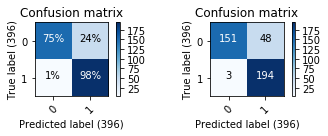

In [7]:
#BATCH_SIZE = 10
#for batch in range(round(train_balance_generator.size/BATCH_SIZE)):
#    logger.info('Batch ' + str(batch) + '...')
#    X_train, Y_train = utils.dump_xy_to_array(train_generator, BATCH_SIZE, x=True, y=True)

#X = utils.extract_hogs(X_train)
#Y_true = utils.onehot_to_label(Y_train)
#Y_true = np.array([l if l==5 else 0 for l in Y_true])

logger.info('Training SVM...')
#ovr = OneVsRestClassifier(LinearSVC(random_state=0))
ovr = OneVsRestClassifier(SVC(probability=True))

#train just on two classes: 1-lion or 0-non-lion
Y_train_2 = np.array([0 if x==5 else 1 for x in Y_train])
Y_valid_2 = np.array([0 if x==5 else 1 for x in Y_valid])
Y_test_2 = np.array([0 if x==5 else 1 for x in Y_test])

svm_model = ovr.fit(X_chog_train, Y_train_2)

Y_train_pred = svm_model.predict(X_chog_train)
acc = metrics.accuracy_score(Y_train_2, Y_train_pred)
logger.info('Train accuracy: ' + str(acc))

Y_valid_pred = svm_model.predict(X_chog_valid)
acc = metrics.accuracy_score(Y_valid_2, Y_valid_pred)
logger.info('Validation accuracy: ' + str(acc))

Y_test_pred = svm_model.predict(X_chog_test)
Y_test_prob = svm_model.predict_proba(X_chog_test)
acc = metrics.accuracy_score(Y_test_2, Y_test_pred)
logger.info('Test accuracy: ' + str(acc))

logger.debug("Done")

utils.evaluate_predictions(Y_valid_2, Y_valid_pred)

### Show prediction images

2017-05-22 00:09:39,958 INFO showing 10 images
2017-05-22 00:09:39,962 INFO > [started] generating image patches. rows=2; cols=10...


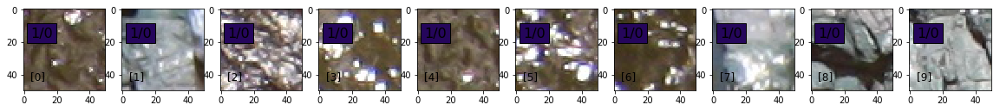

2017-05-22 00:09:40,800 INFO > [done]    generating image patches. rows=2; cols=10 (838.583 ms)


In [8]:
Y_test_pred
Y_test_true0 = utils.onehot_to_label(Y_test_2)
il = []
for i,yp in enumerate(Y_test_pred):
    il.append(str(yp) + '/' + str(Y_test_true0[i]))

utils.show_images(X_test[0:10], image_labels=il, cols=10, size=2)

### Test: Find lions on image

preparing blur


2017-05-22 00:09:41,376 INFO > [started] sliding_window...


3720/3744 [=========================>] 99% 31s remaining=0s sliding windoww

2017-05-22 00:10:13,071 INFO > [done]    sliding_window (31694.671 ms)
2017-05-22 00:10:13,073 INFO > [started] non_max_suppression. boxes=9680...
2017-05-22 00:10:48,783 INFO > [done]    non_max_suppression. boxes=9680 (35710.036 ms)


regions found:
4841


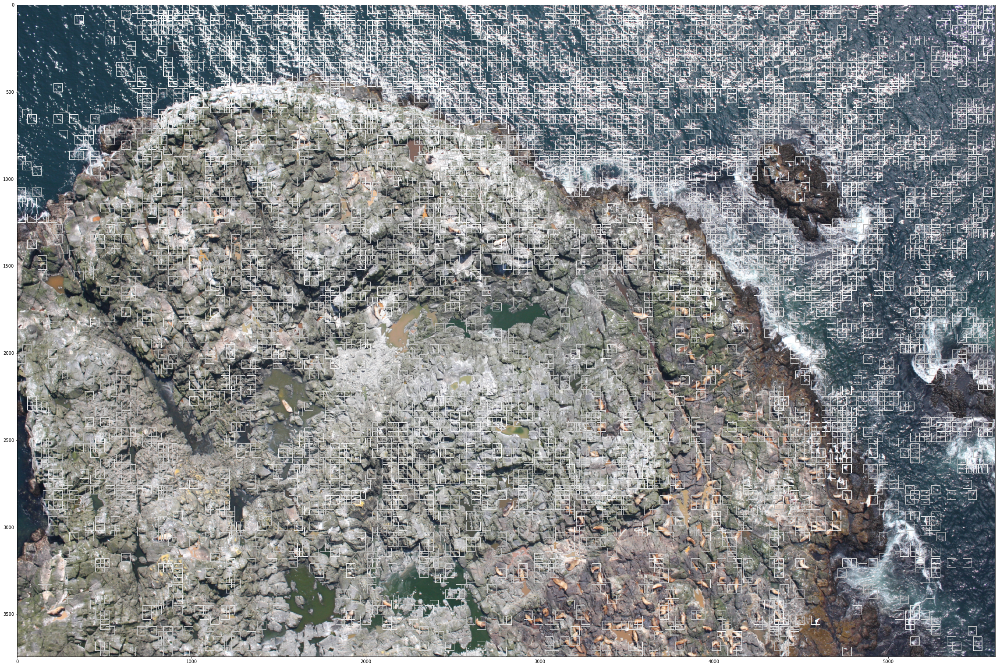

2017-05-22 00:10:52,857 INFO showing 60 images
2017-05-22 00:10:52,860 INFO > [started] generating image patches. rows=7; cols=10...


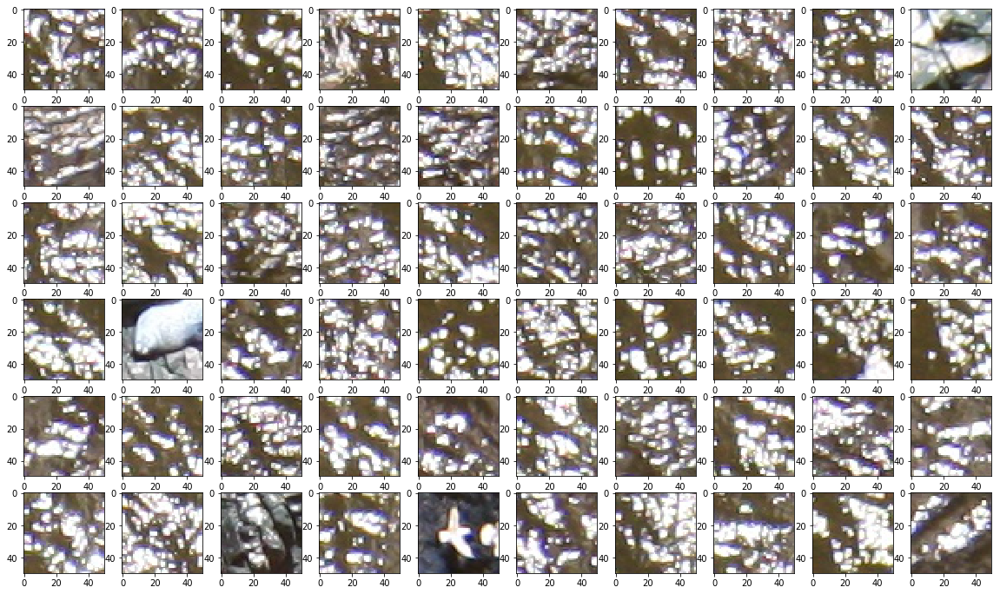

2017-05-22 00:10:57,653 INFO > [done]    generating image patches. rows=7; cols=10 (4792.403 ms)


In [9]:
import numpy as np
import skimage.feature as feature
import skimage.transform as transform
from sklearn.feature_extraction import image
from itertools import permutations

img_path = INPUT_DIR2 + '47.jpg'
img = cv2.imread(img_path)
#img = img[1800:4000,2000:3300]
#img = img[3000:4000,2500:3500]
#img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY).astype('u1')

def eval_region(region_img):
    try:
        region_chog = [ch.extract(cv2.cvtColor(region_img,cv2.COLOR_BGR2GRAY).astype('u1'))]
        score = svm_model.predict_proba(region_chog)
    except:
        return 0
    return score[0][1] * 255

img2 = img.copy()

print('preparing blur')
img2 = cv2.GaussianBlur(img2,(5,5),3)

region_generator = objectdetect.sliding_window_generator(img2, step=(30,30), window=IMAGE_DIMS, pyramid_max_layers=1)
good_regions, imgs = objectdetect.evaluate_regions(region_generator, eval_region, score_threshold=180, apply_non_max_suppression=True, supression_overlap_threshold=0.3, threads=None)

print('regions found:')
print(len(good_regions))

patches = []
for i, region in enumerate(good_regions):
    score = int(good_regions[i][4])
    p = img[region[0]:region[0]+region[2],region[1]:region[1]+region[3]]
    patches.append(p)
    cv2.rectangle(img2, (region[1],region[0]), (region[3]+region[1],region[2]+region[0]), color=(score,score,score), thickness=2)    

utils.show_image(img2, size=40, is_bgr=True)
utils.show_images(patches[100:160], size=2, cols=10)

### Test model

2017-05-22 00:10:57,660 INFO Evaluating svm model performance samples)...
2017-05-22 00:10:57,757 INFO Accuracy: 0.676767676768
2017-05-22 00:10:57,759 INFO Number of test samples: 396
2017-05-22 00:10:57,761 INFO Kappa score: 0.376485349472 (-1 bad; 0 just luck; 1 great)
2017-05-22 00:10:57,763 INFO 
             precision    recall  f1-score   support

          0       0.98      0.40      0.57       211
          1       0.59      0.99      0.74       185

avg / total       0.80      0.68      0.65       396

2017-05-22 00:10:57,765 INFO Accuracy per class:
2017-05-22 00:10:57,766 INFO 0: 97.7%
2017-05-22 00:10:57,767 INFO 1: 59.2%
2017-05-22 00:10:57,769 INFO Confusion matrix:
2017-05-22 00:10:57,770 INFO 
[[ 85 126]
 [  2 183]]


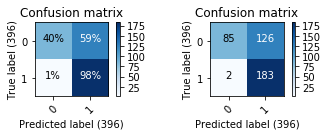

In [10]:
logger.info('Evaluating svm model performance samples)...')
Y_test_pred = svm_model.predict(X_chog_test)
utils.evaluate_predictions(Y_test_2, Y_test_pred)